In [1]:
import matplotlib.pyplot as plt
import matplotlib.colors as colors 

from pathlib import Path
#import polars as pl
import pandas as pd
import numpy as np

In [2]:
def lux_category(lux_value):
    """
    Illuminance (lux) Surfaces illuminated by
    0.0001 Moonless, overcast night sky (starlight)[5]
    0.002 Moonless clear night sky with airglow[5]
    0.05–0.3 Full moon on a clear night[6]
    3.4 Dark limit of civil twilight under a clear sky[7]
    20–50 Public areas with dark surroundings[8]
    50 Family living room lights (Australia, 1998)[9]
    80 Office building hallway/toilet lighting[10][11]
    100 Very dark overcast day[5]
    150 Train station platforms[12]
    320–500 Office lighting[9][13][14][15]
    400 Sunrise or sunset on a clear day.
    1000 Overcast day;[5] typical TV studio lighting
    10,000–25,000 Full daylight (not direct sun)[5]
    32,000–100,000 Direct sunlight
    """
    partitions = [
    0.0001,
    0.002,
    0.05, #Full moon on a clear night[6]
    0.3,  #Full moon on a clear night[6]
    3.4,  #Dark limit of civil twilight under a clear sky[7]
    20, #Public areas with dark surroundings[8]
    #50, #Public areas with dark surroundings[8]
    50, #Family living room lights (Australia, 1998)[9]
    80, #Office building hallway/toilet lighting[10][11]
    100, #Very dark overcast day[5]
    150, #Train station platforms[12]
    320, #Office lighting[9][13][14][15]
    400, #Sunrise or sunset on a clear day.
    500, #Office lighting[9][13][14][15]
    1000, #Overcast day;[5] typical TV studio lighting
    10_000, #Full daylight (not direct sun)[5]
    25_000, #Full daylight (not direct sun)[5]
    32_000,
    100_000 #Direct sunlight
    ]
    for i, p in enumerate(partitions):
        if lux_value <= p:
            return i
    return len(partitions)

In [3]:
df = pd.read_csv("../../input/parquet_exist.csv")

In [4]:
df

,id,Basic_Demos-Age,Basic_Demos-Sex,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,...,PCIAT-PCIAT_Total,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-computerinternet_hoursday,sii,parquet_data_exist,file_num,file_of_length,non-wear_length,percent_non-wear_length
0,00115b9f,9,0,71.0,18.292347,56.00,81.6,NaN,60.0,97.0,...,44.0,31.0,45.0,0.0,1.0,True,1,43330,0,0.000000
1,001f3379,13,1,50.0,22.279952,59.50,112.2,NaN,60.0,73.0,...,34.0,40.0,56.0,0.0,1.0,True,1,396396,252760,0.637645
2,00f332d1,14,0,68.0,17.168636,66.50,108.0,NaN,60.0,71.0,...,47.0,30.0,43.0,2.0,1.0,True,1,414384,68545,0.165414
3,01085eb3,12,0,58.0,34.187282,60.50,178.0,NaN,67.0,81.0,...,30.0,53.0,73.0,0.0,0.0,True,1,370956,12793,0.034487
4,012cadd8,9,0,60.0,17.089151,53.20,68.8,NaN,62.0,88.0,...,9.0,27.0,40.0,0.0,0.0,True,1,97048,0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
991,fe9c71d8,9,0,80.0,15.891137,56.75,72.8,NaN,44.0,65.0,...,29.0,33.0,47.0,0.0,0.0,True,1,426684,55612,0.130335
992,fecc07d6,7,0,85.0,15.986589,49.00,54.6,NaN,59.0,80.0,...,14.0,34.0,49.0,0.0,0.0,True,1,414300,384684,0.928516
993,ff18b749,7,0,NaN,14.768842,47.50,47.4,NaN,58.0,99.0,...,0.0,62.0,85.0,0.0,0.0,True,1,384900,0,0.000000
994,ffcd4dbd,11,0,68.0,21.441500,60.00,109.8,NaN,79.0,99.0,...,31.0,56.0,77.0,0.0,1.0,True,1,416275,7744,0.018603


In [5]:
parq_dir = Path("../../input/series_train.parquet/")

ID = "00115b9f"

In [6]:
sample = pd.read_parquet(parq_dir / f"id={ID}/part-0.parquet")

In [7]:
sample

,step,X,Y,Z,enmo,anglez,non-wear_flag,light,battery_voltage,time_of_day,weekday,quarter,relative_date_PCIAT
0,0,0.021536,0.022214,-1.022370,0.022853,-88.280762,0.0,53.000000,4188.000000,56940000000000,4,3,41.0
1,1,0.022005,0.022187,-1.019740,0.020231,-88.241707,0.0,51.666668,4188.166504,56945000000000,4,3,41.0
2,2,0.022240,0.022005,-1.019401,0.019893,-88.170067,0.0,50.333332,4188.333496,56950000000000,4,3,41.0
3,3,0.021589,0.022578,-1.018177,0.018667,-88.250031,0.0,50.500000,4188.500000,56955000000000,4,3,41.0
4,4,0.022005,0.023763,-1.014323,0.016848,-88.130775,0.0,33.166668,4181.000000,57235000000000,4,3,41.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
43325,43325,-0.008333,-0.023620,-1.006901,0.007224,-88.595741,0.0,0.000000,3824.000000,57580000000000,6,3,85.0
43326,43326,0.048730,-0.076725,-0.953776,0.056839,-85.352219,0.0,0.000000,3824.000000,57640000000000,6,3,85.0
43327,43327,0.387370,0.793151,-0.402214,0.069961,-24.097908,0.0,0.000000,3824.000000,57645000000000,6,3,85.0
43328,43328,0.801953,0.501589,-0.040937,0.045489,-2.113776,0.0,0.000000,3824.000000,57650000000000,6,3,85.0


In [8]:
sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))

In [9]:
sample

,step,X,Y,Z,enmo,anglez,non-wear_flag,light,battery_voltage,time_of_day,weekday,quarter,relative_date_PCIAT,lux_category
0,0,0.021536,0.022214,-1.022370,0.022853,-88.280762,0.0,53.000000,4188.000000,56940000000000,4,3,41.0,7
1,1,0.022005,0.022187,-1.019740,0.020231,-88.241707,0.0,51.666668,4188.166504,56945000000000,4,3,41.0,7
2,2,0.022240,0.022005,-1.019401,0.019893,-88.170067,0.0,50.333332,4188.333496,56950000000000,4,3,41.0,7
3,3,0.021589,0.022578,-1.018177,0.018667,-88.250031,0.0,50.500000,4188.500000,56955000000000,4,3,41.0,7
4,4,0.022005,0.023763,-1.014323,0.016848,-88.130775,0.0,33.166668,4181.000000,57235000000000,4,3,41.0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43325,43325,-0.008333,-0.023620,-1.006901,0.007224,-88.595741,0.0,0.000000,3824.000000,57580000000000,6,3,85.0,0
43326,43326,0.048730,-0.076725,-0.953776,0.056839,-85.352219,0.0,0.000000,3824.000000,57640000000000,6,3,85.0,0
43327,43327,0.387370,0.793151,-0.402214,0.069961,-24.097908,0.0,0.000000,3824.000000,57645000000000,6,3,85.0,0
43328,43328,0.801953,0.501589,-0.040937,0.045489,-2.113776,0.0,0.000000,3824.000000,57650000000000,6,3,85.0,0


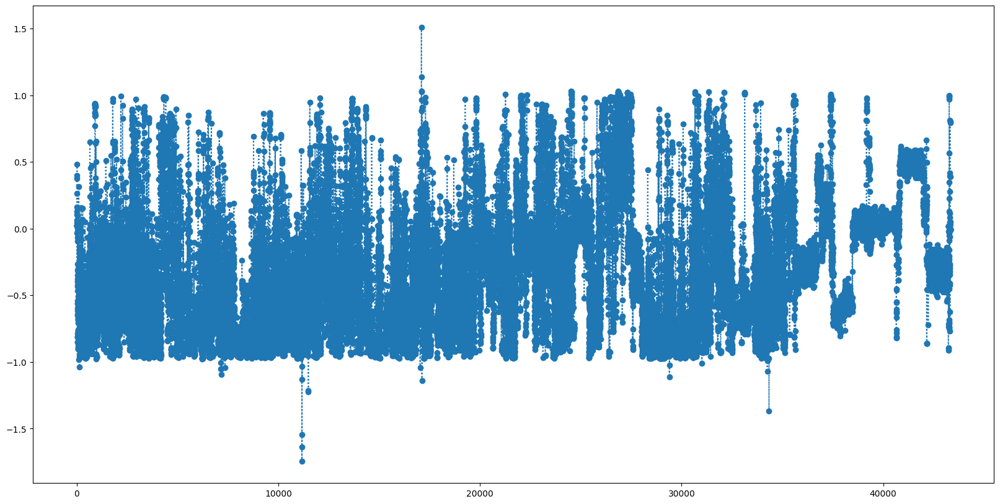

In [10]:
plt.figure(figsize=(20, 10))
plt.plot(sample["step"], sample["X"], marker="o", linestyle=":")

In [11]:
# black = "#000000"
# yellow = "#ffff00"

colors = np.linspace((0,0,0), (1,1,0), 16)
#rgbs = [colors.hsv_to_rgb(hue, sat) for sat in saturations]

In [12]:
colors

array([[0.        , 0.        , 0.        ],
       [0.06666667, 0.06666667, 0.        ],
       [0.13333333, 0.13333333, 0.        ],
       [0.2       , 0.2       , 0.        ],
       [0.26666667, 0.26666667, 0.        ],
       [0.33333333, 0.33333333, 0.        ],
       [0.4       , 0.4       , 0.        ],
       [0.46666667, 0.46666667, 0.        ],
       [0.53333333, 0.53333333, 0.        ],
       [0.6       , 0.6       , 0.        ],
       [0.66666667, 0.66666667, 0.        ],
       [0.73333333, 0.73333333, 0.        ],
       [0.8       , 0.8       , 0.        ],
       [0.86666667, 0.86666667, 0.        ],
       [0.93333333, 0.93333333, 0.        ],
       [1.        , 1.        , 0.        ]])

(-1.19, 16.19, 0.0, 1.05)

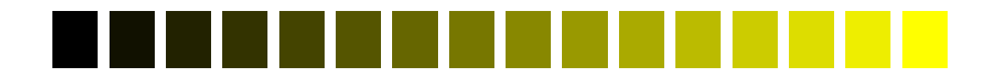

In [13]:
fig, ax = plt.subplots(figsize=(16, 1))
for i, rgb in enumerate(colors):
    ax.bar(i, 1, color=rgb)
ax.axis("off")

In [14]:
sample.columns

Index(['step', 'X', 'Y', 'Z', 'enmo', 'anglez', 'non-wear_flag', 'light',
       'battery_voltage', 'time_of_day', 'weekday', 'quarter',
       'relative_date_PCIAT', 'lux_category'],
      dtype='object')

In [15]:
columns = ['X', 'Y', 'Z', 'enmo', 'anglez', 'light']

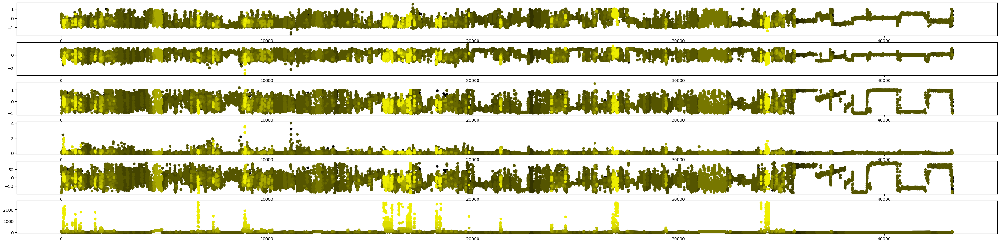

In [16]:
fig, ax = plt.subplots(len(columns),1,figsize=(len(columns)*7, 10))

for i, lux in enumerate(range(0,16,1)):
    plot_df = sample[sample["lux_category"]==lux]
    for j, col in enumerate(columns):
        ax[j].scatter(plot_df["step"], plot_df[col], marker="o", linestyle=":", color=colors[i])

In [17]:
def plot_scatter(sample):
    columns = ['X', 'Y', 'Z', 'enmo', 'anglez', 'light']
    fig, ax = plt.subplots(len(columns),1,figsize=(len(columns)*7, 15))
    
    for i, lux in enumerate(range(0,16,1)):
        plot_df = sample[sample["lux_category"]==lux]
        for j, col in enumerate(columns):
            ax[j].scatter(plot_df["step"], plot_df[col], marker="o", linestyle=":", color=colors[i])
            ax[j].set_title(col)

In [18]:
ID = df[df["sii"]==0].sample(1)["id"].values[0]
ID

'b69bf1f7'

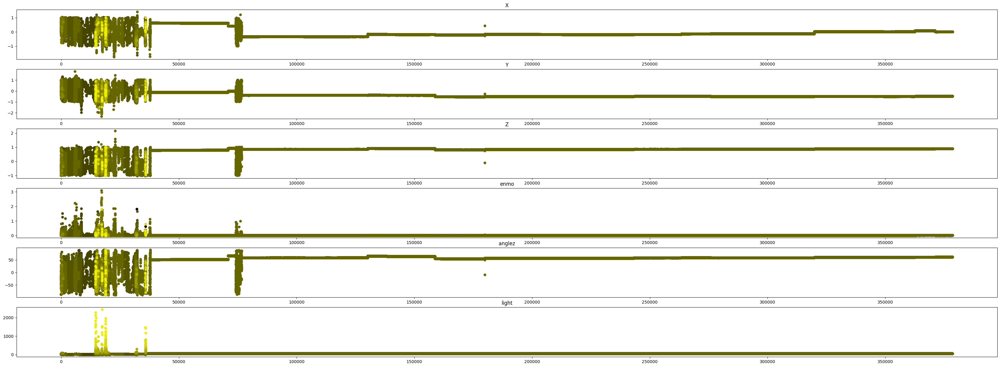

In [19]:
ID = df[df["sii"]==0].sample(1, random_state=1)["id"].values[0]
sample_sii_0 = pd.read_parquet(parq_dir / f"id={ID}/part-0.parquet")
sample_sii_0["lux_category"] = sample_sii_0.light.apply(lambda x: lux_category(x))

plot_scatter(sample_sii_0)

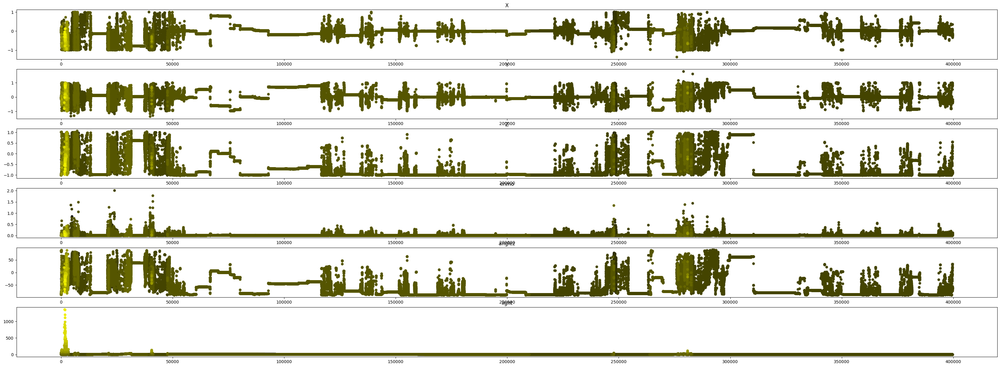

In [20]:
ID = df[df["sii"]==3].sample(1, random_state=1)["id"].values[0]
sample_sii_3 = pd.read_parquet(parq_dir / f"id={ID}/part-0.parquet")
sample_sii_3["lux_category"] = sample_sii_3.light.apply(lambda x: lux_category(x))

plot_scatter(sample_sii_3)

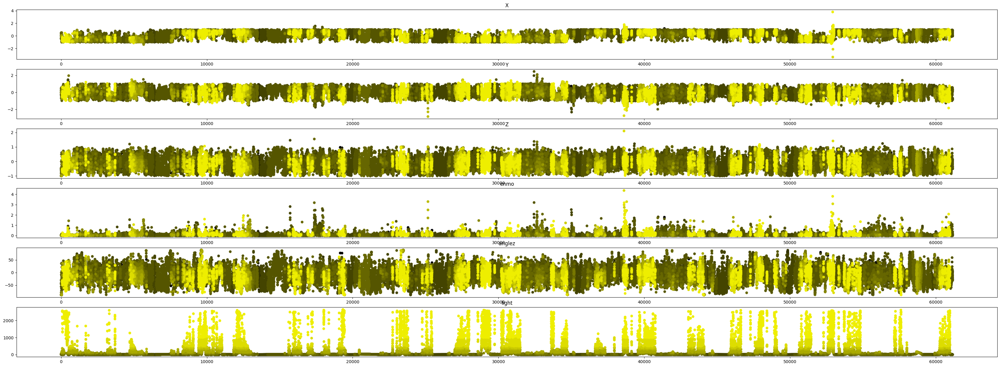

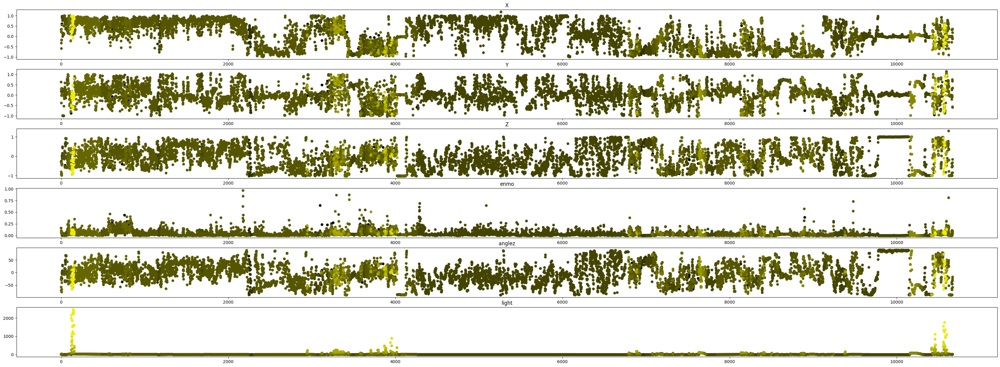

In [21]:
seed = 2

ID = df[df["sii"]==0].sample(1, random_state=seed)["id"].values[0]
sample_sii_0 = pd.read_parquet(parq_dir / f"id={ID}/part-0.parquet")
sample_sii_0["lux_category"] = sample_sii_0.light.apply(lambda x: lux_category(x))
plot_scatter(sample_sii_0)

ID = df[df["sii"]==3].sample(1, random_state=seed)["id"].values[0]
sample_sii_3 = pd.read_parquet(parq_dir / f"id={ID}/part-0.parquet")
sample_sii_3["lux_category"] = sample_sii_3.light.apply(lambda x: lux_category(x))
plot_scatter(sample_sii_3)

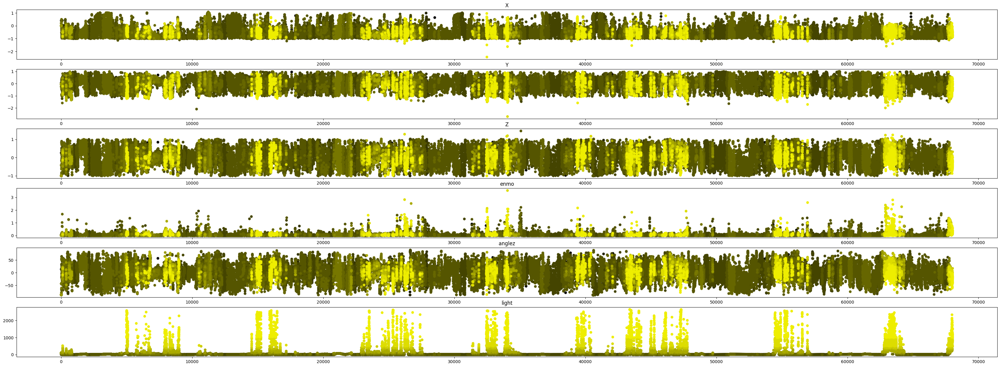

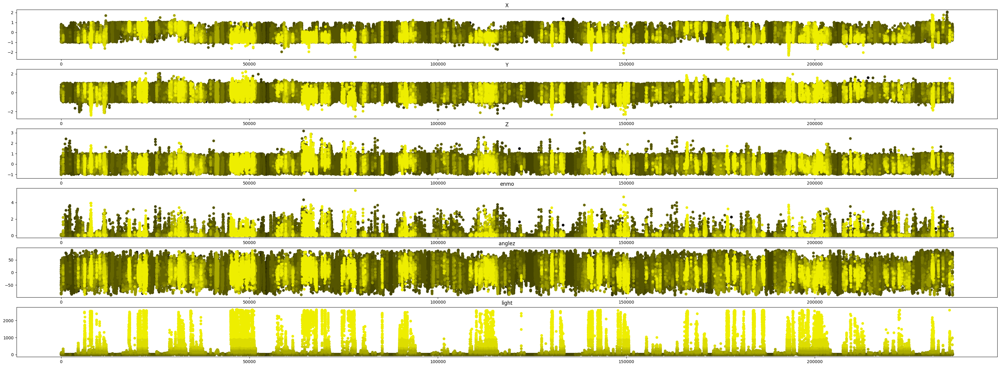

In [22]:
seed = 3

ID = df[df["sii"]==0].sample(1, random_state=seed)["id"].values[0]
sample_sii_0 = pd.read_parquet(parq_dir / f"id={ID}/part-0.parquet")
sample_sii_0["lux_category"] = sample_sii_0.light.apply(lambda x: lux_category(x))
plot_scatter(sample_sii_0)

ID = df[df["sii"]==3].sample(1, random_state=seed)["id"].values[0]
sample_sii_3 = pd.read_parquet(parq_dir / f"id={ID}/part-0.parquet")
sample_sii_3["lux_category"] = sample_sii_3.light.apply(lambda x: lux_category(x))
plot_scatter(sample_sii_3)

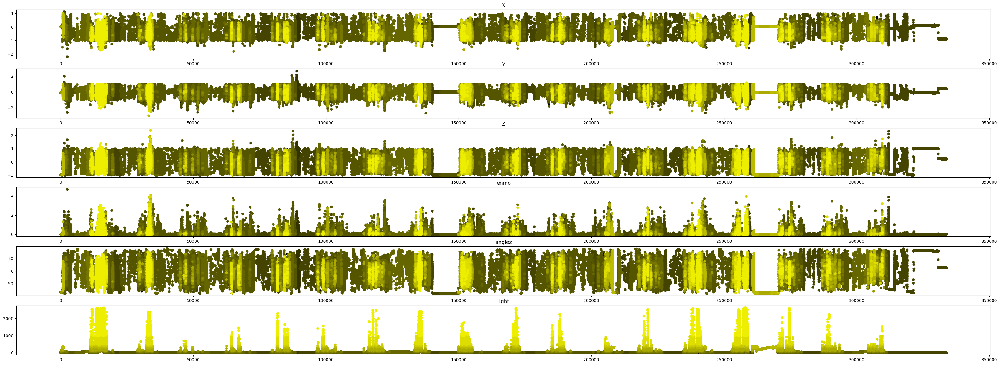

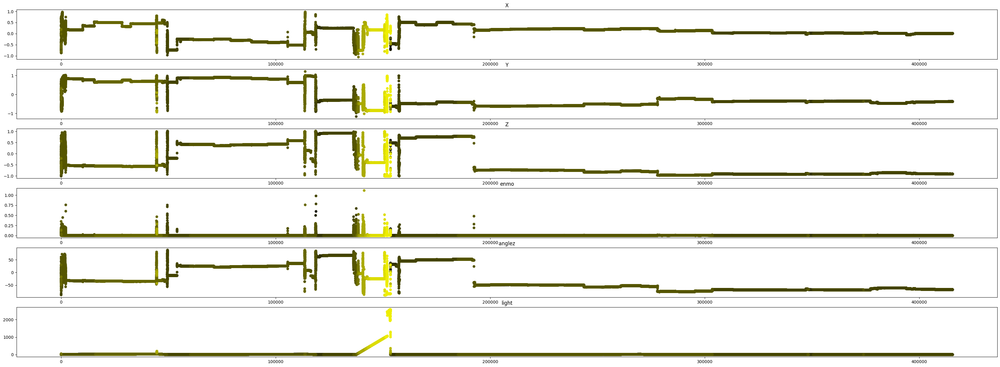

In [23]:
seed = 4

ID = df[df["sii"]==0].sample(1, random_state=seed)["id"].values[0]
sample_sii_0 = pd.read_parquet(parq_dir / f"id={ID}/part-0.parquet")
sample_sii_0["lux_category"] = sample_sii_0.light.apply(lambda x: lux_category(x))
plot_scatter(sample_sii_0)

ID = df[df["sii"]==3].sample(1, random_state=seed)["id"].values[0]
sample_sii_3 = pd.read_parquet(parq_dir / f"id={ID}/part-0.parquet")
sample_sii_3["lux_category"] = sample_sii_3.light.apply(lambda x: lux_category(x))
plot_scatter(sample_sii_3)

In [24]:
def plot_scatter(sample):
    columns = ['X', 'Y', 'Z', 'enmo', 'anglez', 'light']
    fig, ax = plt.subplots(len(columns),1,figsize=(len(columns)*7, 15), sharex=True)
    
    for i, lux in enumerate(range(0,16,1)):
        plot_df = sample[sample["lux_category"]==lux]
        for j, col in enumerate(columns):
            ax[j].scatter(plot_df["step"], plot_df[col], marker="o", linestyle=":", color=colors[i])
            ax[j].set_title(col)

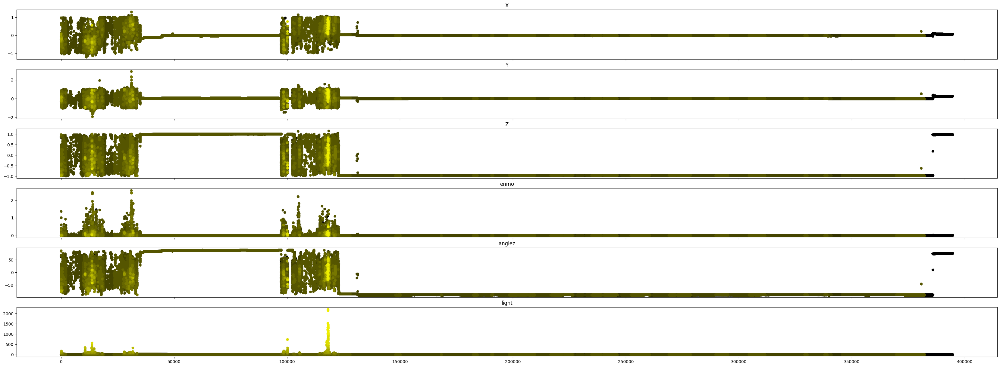

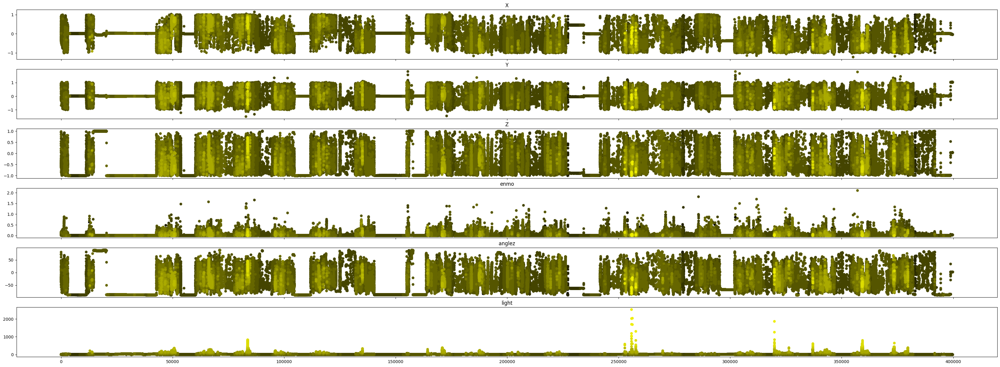

In [25]:
seed = 5

ID = df[df["sii"]==0].sample(1, random_state=seed)["id"].values[0]
sample_sii_0 = pd.read_parquet(parq_dir / f"id={ID}/part-0.parquet")
sample_sii_0["lux_category"] = sample_sii_0.light.apply(lambda x: lux_category(x))
plot_scatter(sample_sii_0)

ID = df[df["sii"]==3].sample(1, random_state=seed)["id"].values[0]
sample_sii_3 = pd.read_parquet(parq_dir / f"id={ID}/part-0.parquet")
sample_sii_3["lux_category"] = sample_sii_3.light.apply(lambda x: lux_category(x))
plot_scatter(sample_sii_3)

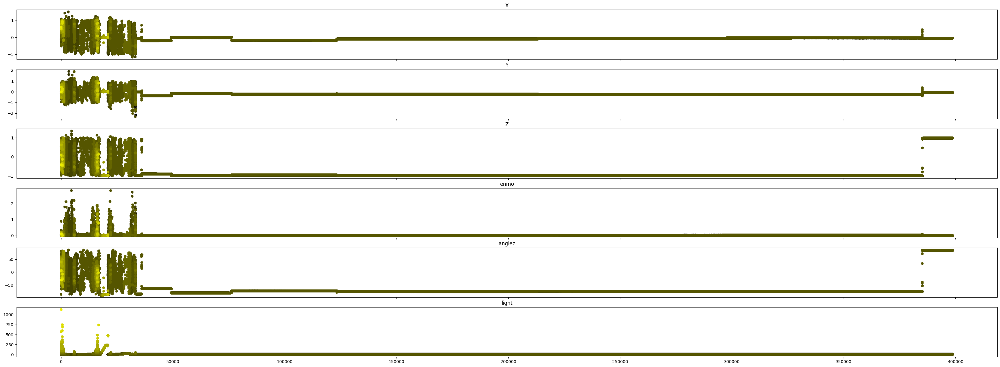

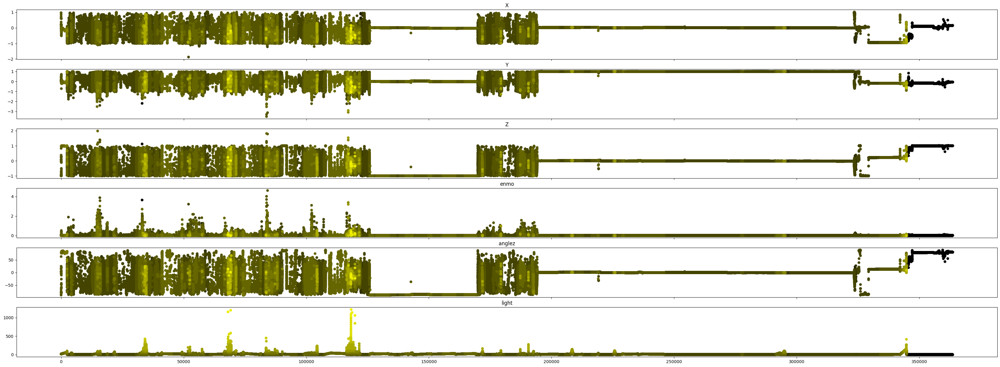

In [26]:
seed = 6

ID = df[df["sii"]==0].sample(1, random_state=seed)["id"].values[0]
sample_sii_0 = pd.read_parquet(parq_dir / f"id={ID}/part-0.parquet")
sample_sii_0["lux_category"] = sample_sii_0.light.apply(lambda x: lux_category(x))
plot_scatter(sample_sii_0)

ID = df[df["sii"]==3].sample(1, random_state=seed)["id"].values[0]
sample_sii_3 = pd.read_parquet(parq_dir / f"id={ID}/part-0.parquet")
sample_sii_3["lux_category"] = sample_sii_3.light.apply(lambda x: lux_category(x))
plot_scatter(sample_sii_3)